# SAGAN + SNGAN +D2GAN

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

from fastai.conv_learner import *
from fastai.dataset import *
from torch.nn import Parameter
import gzip
import random
import sys
import time
torch.cuda.set_device(0)

def localtime(): return time.strftime('_%m%d.%H%M',time.localtime(time.time()))
ltime = localtime()

# prepare data
PATH = Path(r'C:\data\CelebA/') #  ◀ ◀ ◀ ◀ ◀  change to you dir
IMG_PATH = PATH/'train'
CSV_PATH = PATH/'files.csv'
CSV_SAMPLE_PATH = PATH/'files_sample.csv'
SAVE_PATH = PATH/'save'        # save Generated image every epoch
SAVE_PATH.mkdir(exist_ok=True)
TMP_PATH = PATH/'tmp'          # save pretrained weights
TMP_PATH.mkdir(exist_ok=True)
npy_PATH = PATH/'npy'          # save play images
npy_PATH.mkdir(exist_ok=True)

'''
create your dataset csv file to uncomment below
'''
# # Optional - sampling a subset of files
# files = PATH.glob('train/*.png')


# with CSV_SAMPLE_PATH.open('w') as fo:  # create 10% data csv file
#     for f in files:
#         if random.random()<0.1: fo.write(f'{f.relative_to(IMG_PATH)},0\n')
     
# files = PATH.glob('train/*.png')
# with CSV_PATH.open('w') as foo:       # create 100%
#     for f in files:
#         if random.random()<1: foo.write(f'{f.relative_to(IMG_PATH)},0\n')

'\ncreate your dataset csv file to uncomment below\n'

# SNGAN and SAGAN block

In [2]:
'''
pass this cell, or check later
'''

def l2normalize(v, eps=1e-12):
    return v / (v.norm() + eps)

# SpectralNorm
class SNorm(nn.Module):
    def __init__(self, module, name='weight', power_iterations=1):
        super(SNorm, self).__init__()
        self.module = module
        self.name = name
        self.power_iterations = power_iterations
        if not self._made_params():
            self._make_params()

    def _update_u_v(self):
        u = getattr(self.module, self.name + "_u")
        v = getattr(self.module, self.name + "_v")
        w = getattr(self.module, self.name + "_bar")

        height = w.data.shape[0]
        for _ in range(self.power_iterations):
            v.data = l2normalize(torch.mv(torch.t(w.view(height,-1).data), u.data))
            u.data = l2normalize(torch.mv(w.view(height,-1).data, v.data))

        # sigma = torch.dot(u.data, torch.mv(w.view(height,-1).data, v.data))
        sigma = u.dot(w.view(height, -1).mv(v))
        setattr(self.module, self.name, w / sigma.expand_as(w))

    def _made_params(self):
        try:
            u = getattr(self.module, self.name + "_u")
            v = getattr(self.module, self.name + "_v")
            w = getattr(self.module, self.name + "_bar")
            return True
        except AttributeError:
            return False


    def _make_params(self):
        w = getattr(self.module, self.name)

        height = w.data.shape[0]
        width = w.view(height, -1).data.shape[1]

        u = Parameter(w.data.new(height).normal_(0, 1), requires_grad=False)
        v = Parameter(w.data.new(width).normal_(0, 1), requires_grad=False)
        u.data = l2normalize(u.data)
        v.data = l2normalize(v.data)
        w_bar = Parameter(w.data)

        del self.module._parameters[self.name]

        self.module.register_parameter(self.name + "_u", u)
        self.module.register_parameter(self.name + "_v", v)
        self.module.register_parameter(self.name + "_bar", w_bar)


    def forward(self, *args):
        self._update_u_v()
        return self.module.forward(*args)

# SAGAN Self_Attn block
class Self_Attn(nn.Module):
    """ Self attention Layer"""
    def __init__(self,in_dim,activation):
        super(Self_Attn,self).__init__()
        self.chanel_in = in_dim
        self.activation = activation
        
        self.query_conv = nn.Conv2d(in_channels = in_dim , out_channels = in_dim//8 , kernel_size= 1)
        self.key_conv =   nn.Conv2d(in_channels = in_dim , out_channels = in_dim//8 , kernel_size= 1)
        self.value_conv = nn.Conv2d(in_channels = in_dim , out_channels = in_dim ,    kernel_size= 1)
        self.gamma = nn.Parameter(torch.zeros(1))  # gamma是可以训练的

        self.softmax  = nn.Softmax(dim=-1) #
    def forward(self,x):
        """
            inputs :
                x : input feature maps( B X C X W X H)
            returns :
                out : self attention value + input feature 
                attention: B X N X N (N is Width*Height)
        """
        m_batchsize,C,width ,height = x.size()
        proj_query  = self.query_conv(x).view(m_batchsize, -1, width*height).permute(0, 2, 1) # B X CX(N)
        proj_key =  self.key_conv(x).view(m_batchsize, -1, width*height) # B X C x (*W*H)
        energy =  torch.bmm(proj_query, proj_key) # transpose check
        attention = self.softmax(energy) # BX (N) X (N) 

        proj_value = self.value_conv(x).view(m_batchsize,-1, width*height) # B X C X N

        out = torch.bmm(proj_value, attention.permute(0,2,1) )
        out = out.view(m_batchsize, C, width, height)
        
        out = self.gamma*out + x
        return out,attention
    
print_on=True
print_false =0    
def print_shape(layer, name='', print_on=True):
    global print_false
    if print_on == False:
        print_false = 1
    if print_false == 0:
        ly_shape = np.array(np.shape(layer)).tolist()
        print(f'{name:12}: {str(ly_shape):20}')

# G

In [3]:
class TransConv(nn.Module):
    def __init__(self, ni, no, ks, stride, pad, bn=True):
        super().__init__()
        
        self.conv = SNorm(nn.ConvTranspose2d(ni, no, ks, stride, 
                                       padding=pad, bias=False))
        self.bn = nn.BatchNorm2d(no)
        self.relu = nn.ReLU(inplace=True) 
        
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x) if self.bn else x
        x = self.relu(x)
        return x
    
    
class FC_BN_Relu(nn.Module):
    def __init__(self, ni, no, bn=False, drop=0, relu=True):
        super().__init__()
        self.drop = nn.Dropout(drop) if drop else None
        self.fc = SNorm(nn.Linear(ni, no))
        self.bn = nn.BatchNorm1d(no) if bn else None
        self.Relu = nn.ReLU(inplace=True) if relu else None
    def forward(self, x):
        if self.drop:
            x = self.drop(x)
        x = self.fc(x)
        if self.bn: x = self.bn(x)
        if self.Relu: x = self.Relu(x) 
        return x

    
class DCGAN_G(nn.Module):
    def __init__(self, isize, nz, nc, ngf, n_extra_layers=0, print_on=True, dropout=None, first_fc=0, bn=False, SA=[]):
        super(DCGAN_G, self).__init__()
        self.print_on=print_on
        self.ngf = ngf
        self.nz = nz
        
        self.fc_1 = FC_BN_Relu(nz ,first_fc, bn=bn, drop=0, relu=True)
        self.fc_2 = FC_BN_Relu(first_fc, ngf*8*4*4, bn=bn, drop=0, relu=True)

        self.main = nn.Sequential(
        # (ngf * 8) x 4 x 4
            TransConv(ngf*8, ngf*4,     4, 2, 1,),         
        # (ngf * 4) x 8 x 8 
            TransConv(ngf*4, ngf*2,     4, 2, 1,),       
        # (ngf * 2) x 16 x 16
            TransConv(ngf*2, ngf,       4, 2, 1,),
        # ngf x 32 x 32
            TransConv(ngf, int(ngf/2),       4, 2, 1,),
        # ngf x 64 x 64 
            SNorm(nn.ConvTranspose2d(int(ngf/2), nc, 4, 2, 1)), # last layer no BN, no relu      
        # ngf x 128 x 128 
        )
        
        self.SA=SA
        self.SA_dict = {}
        for i in SA:
            self.SA_dict[i] = Self_Attn(int(2048/i), 'relu').cuda()
        
        if n_extra_layers:
            for i in range(n_extra_layers):         
                self.main= nn.Sequential(*self.main[:-1], TransConv(int(ngf/2), int(ngf/2), 3, 1, 1), *self.main[-1:])
                
        if dropout:
            self.main= nn.Sequential(*self.main[:-2], nn.Dropout(dropout), *self.main[-2:])

            
    def forward(self, x):
        print_shape(x, 'input', print_on=self.print_on)   
        x = self.fc_1(x)                             ; print_shape(x, 'fc_1')
        x = self.fc_2(x)                             ; print_shape(x, 'fc_2')
        x = x.view(-1, self.ngf*8 ,4,4)              ; print_shape(x, 'x_view')
    
    # main sequence
        sa_no = 0
        for n,l in enumerate(self.main):
            x = l(x)                                 ; print_shape(x, 'x'+str(n+1))
           # self attn block
            if x.shape[2] in self.SA_dict:
                sa_no+=1; 
                x,_ = self.SA_dict[x.shape[2]](x)    ; print_shape(x, 'attn'+str(x.shape[2]))
                self.SA_dict.pop(x.shape[2])
           
        x = F.tanh(x)  # cause image is between -1 to 1
        
        if self.print_on: 
            print(f'SA_input: {self.SA}    SA_output: {self.SA_dict} \n')
        return x

In [5]:
# check the net
netG = DCGAN_G(64, 100, 3, 64, n_extra_layers=1, dropout=0, first_fc=512, bn=True, SA=[16, 32]).cuda(); netG

DCGAN_G(
  (fc_1): FC_BN_Relu(
    (fc): SNorm(
      (module): Linear(in_features=100, out_features=512, bias=True)
    )
    (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (Relu): ReLU(inplace)
  )
  (fc_2): FC_BN_Relu(
    (fc): SNorm(
      (module): Linear(in_features=512, out_features=8192, bias=True)
    )
    (bn): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (Relu): ReLU(inplace)
  )
  (main): Sequential(
    (0): TransConv(
      (conv): SNorm(
        (module): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
    )
    (1): TransConv(
      (conv): SNorm(
        (module): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affi

In [6]:
# print the shape of all the layers
tensor_G = torch.Tensor(64,100).cuda()
aa = netG(tensor_G)

input       : [64, 100]           
fc_1        : [64, 512]           
fc_2        : [64, 8192]          
x_view      : [64, 512, 4, 4]     
x1          : [64, 256, 8, 8]     
x2          : [64, 128, 16, 16]   
attn16      : [64, 128, 16, 16]   
x3          : [64, 64, 32, 32]    
attn32      : [64, 64, 32, 32]    
x4          : [64, 32, 64, 64]    
x5          : [64, 32, 64, 64]    
x6          : [64, 3, 128, 128]   
SA_input: [16, 32]    SA_output: {} 



# play with pretrianed G

In [4]:
seed = 42
#      ΔΔ   change the seed to change different results

In [5]:
bs=64; nz=100;  sz=128; n_extra_layers=1
netG =  DCGAN_G(sz, nz, 3, 64, 1, print_on=False, dropout=0, first_fc=512, bn=True, SA=[32,16]).cuda() 
netG.load_state_dict(torch.load(r'.\_0922.2234_netG_SaGAN 128 epoch-37.h5'))

tfms = tfms_from_stats(inception_stats, sz)
md = ImageClassifierData.from_csv(PATH, 'train', CSV_SAMPLE_PATH, tfms=tfms, bs=bs, skip_header=False, continuous=True)

def gallery(x, nc=3):
    n,h,w,c = x.shape
    nr = n//nc
    assert n == nr*nc
    return (x.reshape(nr, nc, h, w, c)
              .swapaxes(1,2) # shape((nr,h, nc,w, c))
              .reshape(h*nr, w*nc, c))

def create_noise(b,nz=100,w=1,h=1,std=1): 
    torch.manual_seed(seed)
    return V(torch.zeros(b, nz, w, h).normal_(0, std))

## create noise

In [6]:
def create_image(netGenerate, name, shape, figure_sz, mark=''):
    netGenerate.eval()
    fake = netGenerate(globals()[name]).data.cpu()
    faked = np.clip(md.trn_ds.denorm(fake),0,1)
    width = int(np.sqrt(shape))
    plt.figure(figsize=(figure_sz*width,figure_sz*width))
    plt.text(x=-10,y=-10,s=name+mark, fontdict={'size':20})
    plt.imshow(gallery(faked, width));
    plt.axis('off')
    img_path = rf'{npy_PATH}\{name}.png'
    plt.imsave(fname=img_path, arr=gallery(faked, width))
    print(f'name: {name}  img: {img_path}')
    np.save(rf'{npy_PATH}\{name}.npy', globals()[name])

    
def norm_noise(netGenerate, std=1, shape=64 , figure_sz=1.2, net_mark=''):
    '''
    Create Gaussian space std=1 mean=0
    return torch.tensor
    '''
    
    name = net_mark + '__norm_noise'+str(int(std*10))
    globals()[name] = create_noise(shape, 100, 0,0,(std) )
    create_image(netGenerate, name, shape, figure_sz)
    return globals()[name]


def lin_noise(netGenerate, rate=2, shape=64 , figure_sz=1.2, net_mark=''):
    '''
    Create linear space -0.5 to 0.5 times rate=2 [-1 to 1]
    return torch.tensor   

    rate: end of number (smallest to biggest)
    '''
    torch.manual_seed(seed)
    name = net_mark + 'lin_noise'+str(int(rate*10))
    globals()[name] = (torch.rand(shape,100)-0.5).cuda()*rate
    create_image(netGenerate, name, shape, figure_sz)
    return globals()[name] 

### Uniform distribution noise image

name: lin_noise20  img: C:\data\CelebA\npy\lin_noise20.png


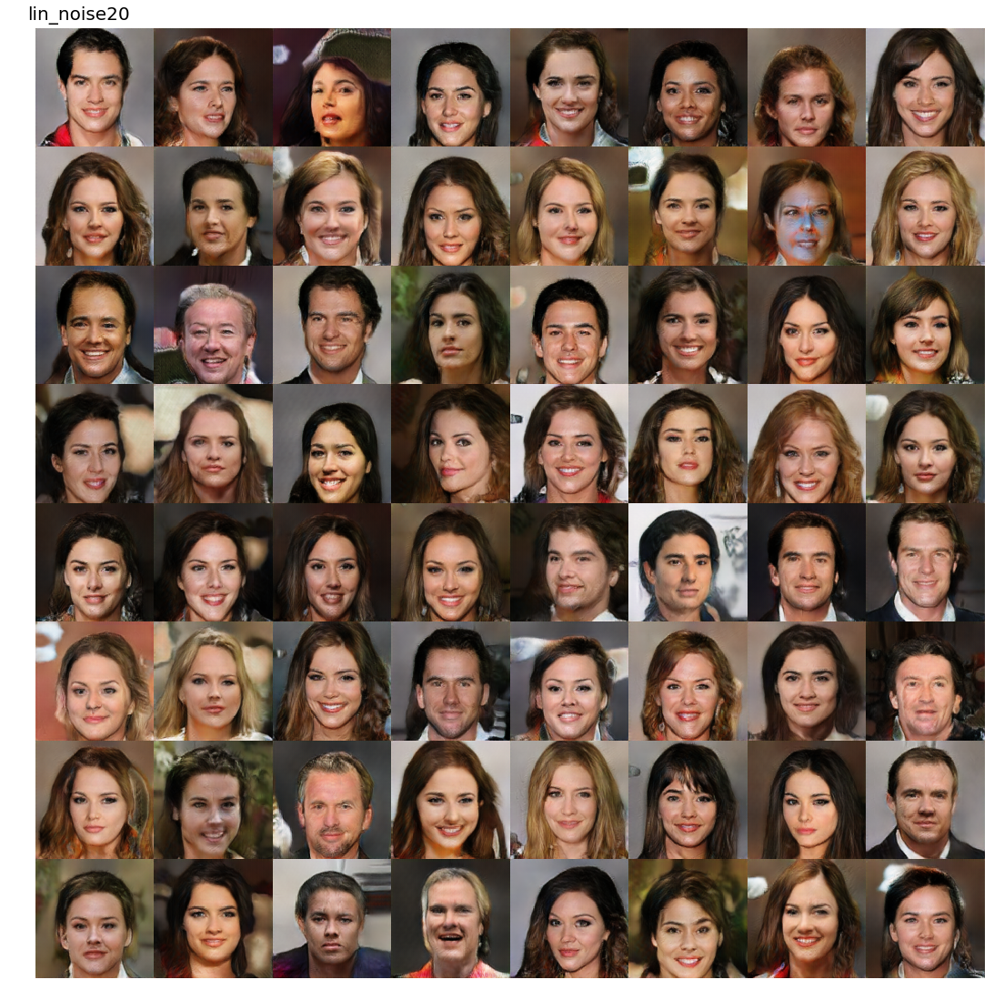

In [12]:
# linear noise set around 2, cause original is -0.5 to 0.5
'''
Train on Guassian but generate on uniform will make the image looks better,
but the uniform images look more similar.
'''
test_noise_lin = lin_noise(netG, rate=2, figure_sz=2.4)
#                                     ΔΔ  play with it  

### Gaussian distribution noise image

name: __norm_noise10  img: C:\data\CelebA\npy\__norm_noise10.png


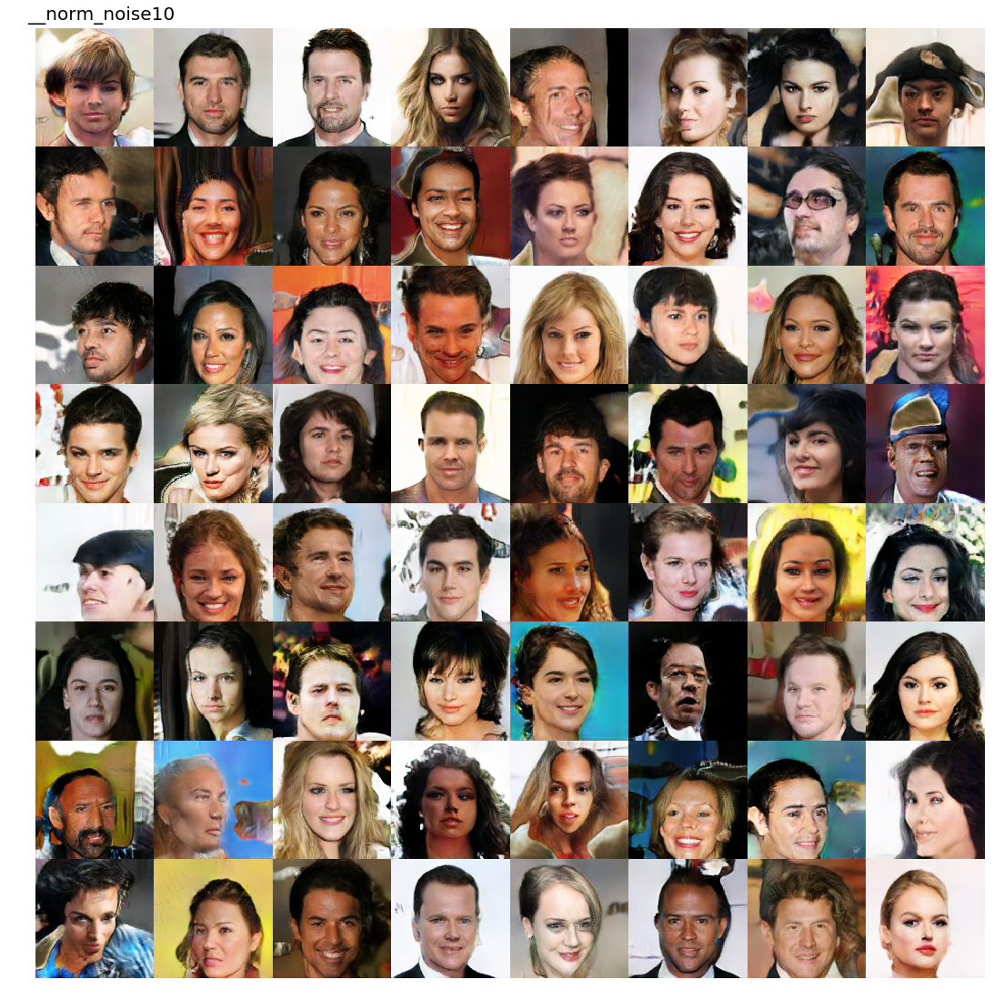

In [13]:
# linear noise set around 1, cause original is -1 to 1
test_noise_norm = norm_noise(netG, std=1, figure_sz=2.4)
#                                      ΔΔ  play with it  

## Continues change on row and colume

In [9]:
def show_one(one, show_square_no=1, sz=1.2):
    one = torch.squeeze(one)
    fake = netG(one[None] if show_square_no==1 else one).data.cpu()
    faked = np.clip(md.trn_ds.denorm(fake),0,1)
    plt.figure(figsize=(sz*show_square_no, sz*show_square_no))
    plt.imshow(gallery(faked, show_square_no));
    plt.axis('off')
    im_path = rf'{npy_PATH}\continues_{localtime()}.png'
    plt.imsave(fname=im_path, arr=gallery(faked, show_square_no)  )
    print(im_path)

def continue_change(one_image, one=5, two=8, end=1, sz=1.2):
    """
    one_image: 输入一张图片
    one: two: 0-100
    """
    aa = T(np.array(to_np([one_image for i in range(64)]))).squeeze()
    linspace_colume = T([np.linspace(0,end,8) for i in range(8)]).reshape(64)
    linspace_row = torch.transpose(T([np.linspace(0,end,8) for i in range(8)]),0,1).reshape(64)
    aa[:,one]+= linspace_colume
    aa[:,two]+= linspace_row
    show_one(T(aa), show_square_no=8, sz=sz)

C:\data\CelebA\npy\continues__1006.1305.png


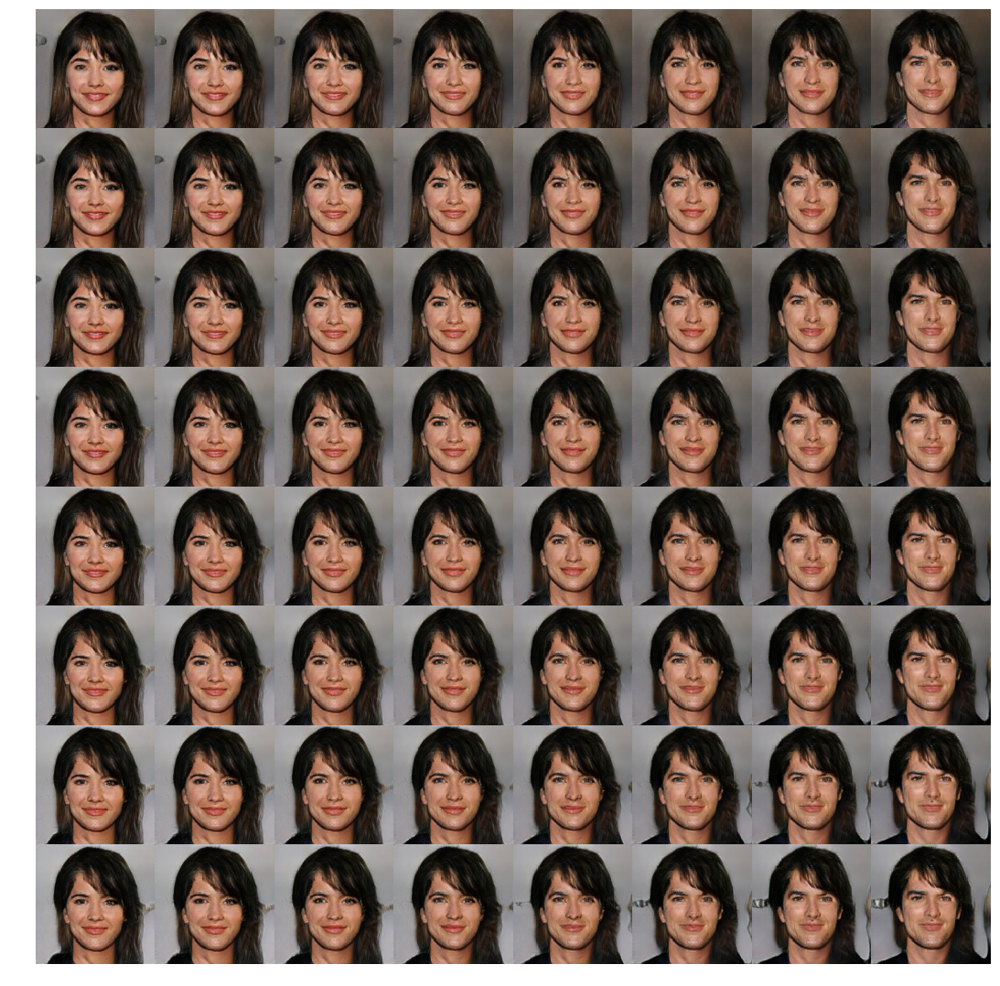

In [10]:
continue_change(lin_noise20[53,:], one=33, two=28, end=3, sz=2.4)
#                           ΔΔ         ΔΔ       ΔΔ     ΔΔ   play with it 
#           image in lin_noise20      row    colume  range

C:\data\CelebA\npy\continues__1006.1308.png


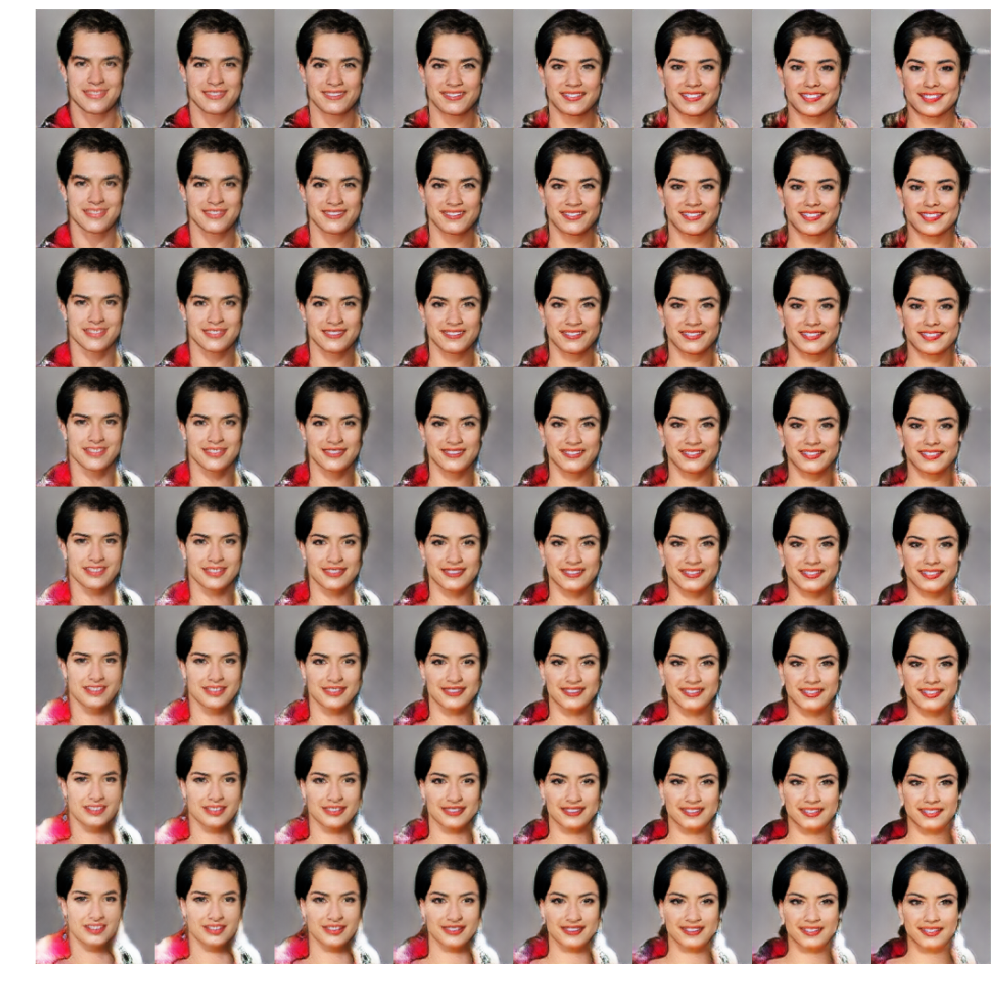

In [14]:
continue_change(test_noise_lin[0, :], one=33, two=8, end=-3, sz=2.4)
#                              ΔΔ         ΔΔ       ΔΔ     ΔΔ   play with it 
#               image in test_noise      row    colume  range

## multi_noise display

In [15]:
'''
compare with different lin noises or gaussian noises
'''

def multi_noise(netGenerate, noise_type='lin', noise_ls=[2], shape=64, figure_sz=1.2, net_mark=''):
    '''
    linear noise_ls:   [2, 2.2, 2.4, 2.6, 2.8, 3, 3.2, 3.4, 3.6, 3.8, 4]
    Gaussian noise_ls: [0.6, 0.7, 0.8, 0.9, 1, 1.1, 1.2, 1.3, 1.4, 1.5]
    '''
    def lin_noise(netGenerate, rate=2, shape=64 , figure_sz=1.2, net_mark=''):
        '''
        Create linear space -0.5 to 0.5 times rate=2 [-1 to 1]
        return torch.tensor   

        rate: end of number (smallest to biggest)
        '''
        name = net_mark + 'lin_noise'+str(int(rate*10))
        globals()[name] = (torch.rand(shape,100)-0.5).cuda()*rate
        create_image(netGenerate, name, shape, figure_sz)
        return globals()[name] 

    
    if noise_type=='norm':
        print(f'Norm Noise:\nnoise_ls: {noise_ls}')
        for i in noise_ls:
            norm_noise(netGenerate, i, shape, figure_sz, net_mark=net_mark)
            
    elif noise_type=='lin':
        print(f'Lin Noise:\nnoise_ls: {noise_ls}')
        for i in noise_ls:
            lin_noise(netGenerate, i, shape, figure_sz, net_mark=net_mark)
    

Lin Noise:
noise_ls: [1.8 1.9 2.  2.1 2.2]
name: net37lin_noise18  img: C:\data\CelebA\npy\net37lin_noise18.png
name: net37lin_noise19  img: C:\data\CelebA\npy\net37lin_noise19.png
name: net37lin_noise20  img: C:\data\CelebA\npy\net37lin_noise20.png
name: net37lin_noise21  img: C:\data\CelebA\npy\net37lin_noise21.png
name: net37lin_noise22  img: C:\data\CelebA\npy\net37lin_noise22.png


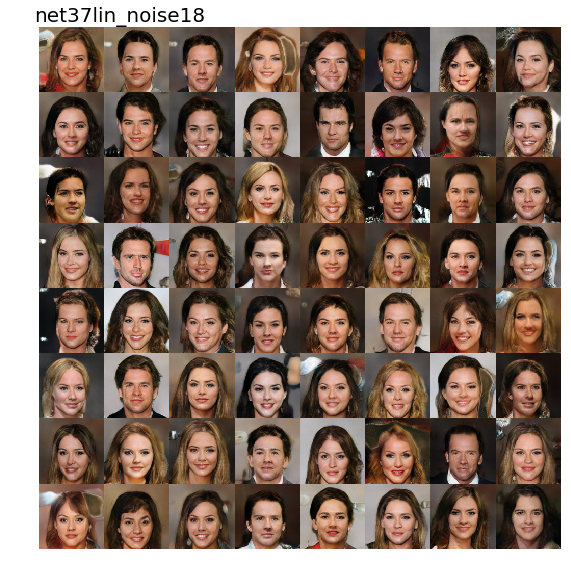

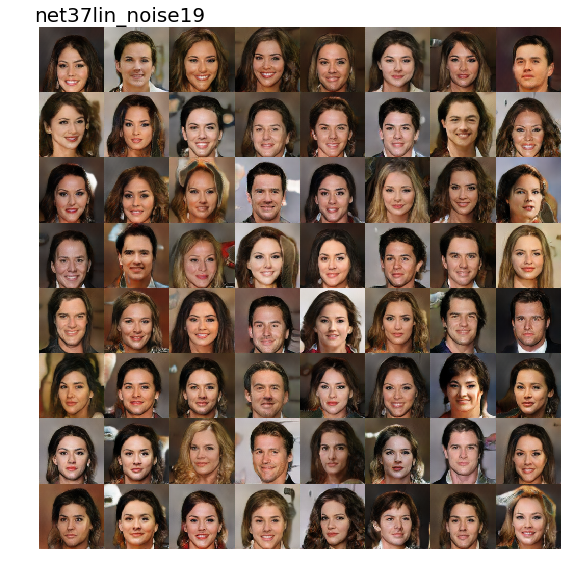

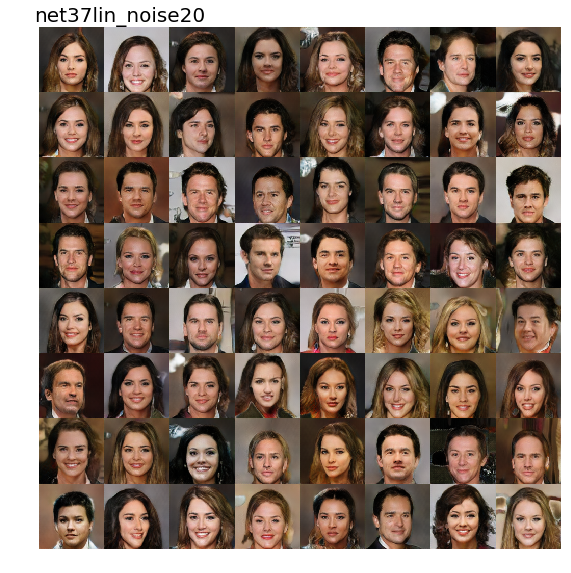

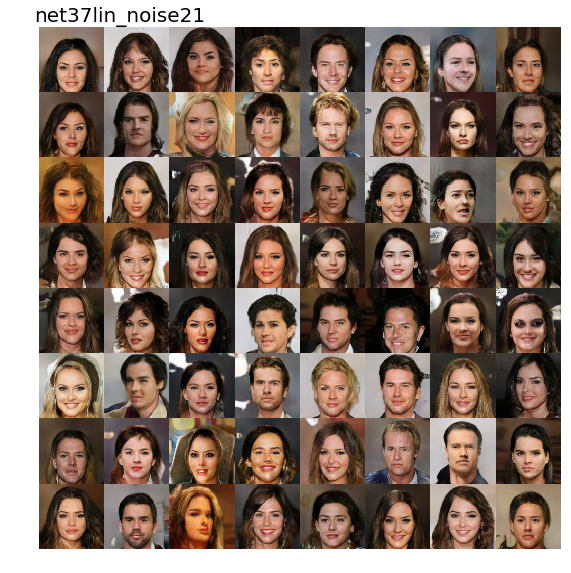

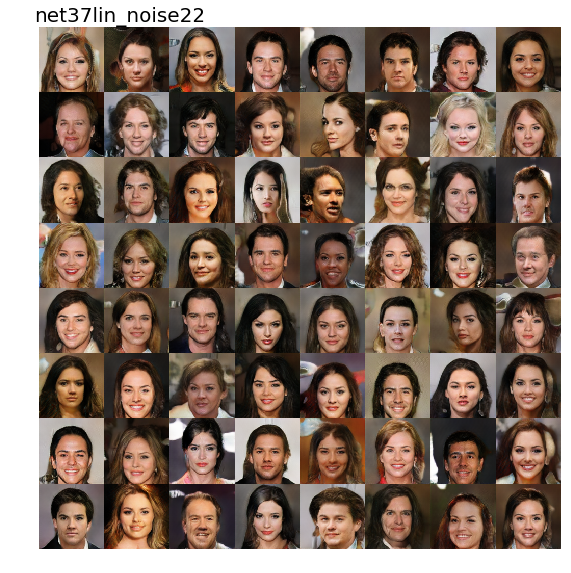

In [16]:
multi_noise(netG, noise_type='lin', noise_ls=np.array([0.8, 0.9, 1, 1.1, 1.2 ])+1, net_mark='net37')
#                             ΔΔ                                ΔΔ                   play with it 
#                   linspace or Gaussian                compare different std

# D

In [4]:
class ConvBlock(nn.Module):
    def __init__(self, ni, no, ks, stride, pad=0, bn=False):
        super().__init__()
        self.conv = SNorm(nn.Conv2d(ni, no, ks, stride, padding=pad, bias=False))
        self.bn = nn.BatchNorm2d(no) if bn else None
        self.lrelu = nn.LeakyReLU(0.1, inplace=True) #  ◁ ◁ ◁ ◁ ◁  # leakyrelu
    
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x) if self.bn else x
        x = self.lrelu(x)
        return x
    
    
class FC_BN_LRelu(nn.Module):
    def __init__(self, ni, no, bn=False, drop=0, relu=True):
        super().__init__()
        self.drop = nn.Dropout(drop) if drop else None
        self.fc = SNorm(nn.Linear(ni, no))
        self.bn = nn.BatchNorm1d(no) if bn else None
        self.LRelu = nn.LeakyReLU(0.1, inplace=True) if relu else None
    def forward(self, x):
        if self.drop:
            x = self.drop(x)  
        x = self.fc(x)
        if self.bn: x = self.bn(x)
        if self.LRelu: x = self.LRelu(x) 
        return x


class DCGAN_D(nn.Module):
    def __init__(self, isize, nc, ndf, n_extra_layers=0, print_on=True, dropout=None, last_fc=0, bn=False, SA=[]):
        """
        isize: input grid size
        nc: num of channel
        ndf: num dim filter(first layer)
        n_extra_layer: how many extra layer after initial layer
        """
        super().__init__()
        self.print_on=print_on
        
        
        self.main = nn.Sequential(
        # (nc) x 128 x 128
            ConvBlock(nc,   int(ndf/2),  4, 2, 1, bn=False), 
        # ndf x 64 x 64
            ConvBlock(int(ndf/2),   ndf, 4, 2, 1),    
        # ndf x 32 x 32
            ConvBlock(ndf,   ndf*2,   4, 2, 1),
        # (ndf * 2) x 16 x 16
            ConvBlock(ndf*2, ndf*4,   4, 2, 1,),
        # (ndf * 4) x 8 x 8
            ConvBlock(ndf * 4, ndf*8, 4, 2, 1),
        # (ndf * 8) x 4 x 4
        )
        

        if n_extra_layers:
            for i in range(n_extra_layers):         
                self.main= nn.Sequential(*self.main[:1], ConvBlock(int(ndf/2), int(ndf/2), 3, 1, 1), *self.main[1:])
        
        self.SA = SA
        self.SA_dict = {}
        for i in SA:
            self.SA_dict[i] = Self_Attn(int(2048/i), 'relu').cuda()
    
        self.Flatten = Flatten()
        self.fc = FC_BN_LRelu(512*4*4 ,last_fc, bn=bn, drop=0, relu=True)
        self.drop = nn.Dropout(dropout) if dropout else None
        self.last = FC_BN_LRelu(last_fc, 1, bn=False, drop=0, relu=False)
            
    def forward(self, x):
        print_shape(x, 'input', print_on=self.print_on) 
    # main
        sa_no=0
        for n,l in enumerate(self.main):
            x = l(x)                                 ; print_shape(x,'x'+str(n+1))
            # self attn block
            if x.shape[2] in self.SA_dict:
                sa_no+=1; 
                x,_ = self.SA_dict[x.shape[2]](x)    ; print_shape(x, 'attn'+str(x.shape[2]))
                self.SA_dict.pop(x.shape[2])
        
    # Flatten
        x = self.Flatten(x)                          ; print_shape(x,'Flatten')
        x = self.fc(x)                               ; print_shape(x,'fc')
        
    # Dropout
        if self.drop:
            x = self.drop(x)  
        x = self.last(x)                             ; print_shape(x,'last_fc')
  
        x = F.softplus(x)
        x = x.view(-1, 1).squeeze(1)

        if self.print_on: 
            print(f'SA_input: {self.SA}    SA_output: {self.SA_dict} \n')
        return x 

In [5]:
netD1 = DCGAN_D(64, 3, 64, n_extra_layers=1, dropout=0.5, last_fc=512, bn=False, SA= [16, 8]).cuda(); netD1

DCGAN_D(
  (main): Sequential(
    (0): ConvBlock(
      (conv): SNorm(
        (module): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (lrelu): LeakyReLU(negative_slope=0.1, inplace)
    )
    (1): ConvBlock(
      (conv): SNorm(
        (module): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (lrelu): LeakyReLU(negative_slope=0.1, inplace)
    )
    (2): ConvBlock(
      (conv): SNorm(
        (module): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (lrelu): LeakyReLU(negative_slope=0.1, inplace)
    )
    (3): ConvBlock(
      (conv): SNorm(
        (module): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (lrelu): LeakyReLU(negative_slope=0.1, inplace)
    )
    (4): ConvBlock(
      (conv): SNorm(
        (module): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
  

In [6]:
tensor_1 = torch.Tensor(64,3,128,128).cuda()
_ = netD1(tensor_1)

input       : [64, 3, 128, 128]   
x1          : [64, 32, 64, 64]    
x2          : [64, 32, 64, 64]    
x3          : [64, 64, 32, 32]    
x4          : [64, 128, 16, 16]   
attn16      : [64, 128, 16, 16]   
x5          : [64, 256, 8, 8]     
attn8       : [64, 256, 8, 8]     
x6          : [64, 512, 4, 4]     
Flatten     : [64, 8192]          
fc          : [64, 512]           
last_fc     : [64, 1]             
SA_input: [16, 8]    SA_output: {} 



# train

In [8]:
def create_noise(b,nz=100,w=1,h=1,std=1): 
    return V(torch.zeros(b, nz, w, h).normal_(0, std))

def gallery(x, nc=3):
    n,h,w,c = x.shape
    nr = n//nc
    assert n == nr*nc
    return (x.reshape(nr, nc, h, w, c)
              .swapaxes(1,2) # shape((nr,h, nc,w, c))
              .reshape(h*nr, w*nc, c))

class Log_loss(torch.nn.Module):
    def __init__(self):
        # negation is true when you minimize -log(val)
        super(Log_loss, self).__init__()
       
    def forward(self, x, negation=True):
        # shape of x will be [batch size]
        log_val = torch.log(x)
        loss = torch.sum(log_val)
        if negation:
            loss = torch.neg(loss)
        return loss
    
class Itself_loss(torch.nn.Module):
    def __init__(self):
        super(Itself_loss, self).__init__()
        
    def forward(self, x, negation=True):
        # shape of x will be [batch size]
        loss = torch.sum(x)
        if negation:
            loss = torch.neg(loss)
        return loss
    
criterion_log =Log_loss()
criterion_itself =Itself_loss()

# plot & save image
def save_plot_image(sz=14):
    netG.eval();  
    fake = netG(fixed_noise).data.cpu()
    faked = np.clip(md.trn_ds.denorm(fake),0,1)
    plt.figure(figsize=(sz,sz))
    plt.imsave(fname=f'{SAVE_PATH}/{ltime}_{type_gan}_{samp}_{ttl_epoch}.png', arr=gallery(faked, 8)  )
    plt.imshow(gallery(faked, 8));
    plt.axis('off')
#     plt.close()


    plt.figure(figsize=(20,12)) # plot & save wass loss 
    plt.plot(A(range(len(wass_D_list)))*(bs/64), wass_D_list, c='b', lw=1, label='D_loss')
    plt.plot(A(range(len(Gloss_list)))*(bs/64), Gloss_list, c='m', ls=':' , lw=1, label=f'G_loss')
    plt.plot([0,len(wass_D_list)],[0,0], c='r', ls=':', lw=1 )
    plt.legend(fontsize=16)
    plt.savefig(f'{SAVE_PATH}/{ltime}_0_{mark}.png', pad_inches=0.1, bbox_inches='tight')
    plt.close()


def save_log():
    with open(f'{SAVE_PATH}/{ltime}_09_log.txt','w') as f: # 保存log
        for i in log_ls:      
            f.write(str(i)+'\n')
        f.write('\nMean:\n')   
        for i in log_mean:      
            f.write(str(i)+'\n')

In [7]:
def train(niter, optimizerD1 , optimizerD2 , optimizerG):
    global ttl_run,lossD, log_ls, log_mean, log_std
    for epoch in range(niter):
        
        data_iter = iter(md.trn_dl)
        i,n = 0,len(md.trn_dl)
        with tqdm(total=n) as pbar:
            while i < n:
#                 set_trainable(netD, True)
#                 set_trainable(netG, False)

                j = 0; std_ls=[]
                while (j < d_iters) and (i < n):
                    netD1.train();netD2.train(); netG.train()
                    j += 1; i += 1
                    ttl_run+=1    
                    real = V(next(data_iter)[0])
                # G Generate an image 
                    fake = netG(create_noise(real.size(0), nz, 0, 0, std=1))

            ######################################
            #          train D1 and D2           #
            ######################################                  
            # train D1
                # D1 sees real as real, minimize -logD1(x)    
                    D1_real = criterion_log(netD1(real)) 

                # D1 sees fake as fake, minimize D1(G(z))      
                    D1_fake = criterion_itself(netD1(fake.detach()), False) 
            
             # train D2           
                # D2 sees real as fake, minimize D2(x)        
                    D2_real = criterion_itself(netD2(real), False)
                    
                # D2 sees fake as real, minimize -log(D2(G(z))  
                    D2_fake =  criterion_log(netD2(fake.detach())) 

                    lossD = (alpha*D1_real + D1_fake) + (D2_real*gama +  beta*D2_fake)
                    netD1.zero_grad()
                    netD2.zero_grad()
                    lossD.backward()
                    optimizerD1.step()
                    optimizerD2.step()

            ######################################
            #             train G                #
            ######################################
                # G: minimize -D1(G(z)): to make D1 see fake as real
                    G1 = criterion_itself(netD1(fake))

                # G: minimize logD2(G(z)): to make D2 see fake as fake
                    G2 = criterion_log(netD2(fake), False)
                    lossG = G1 + delta*G2
                    
                    netG.zero_grad()
                    lossG.backward()
                    optimizerG.step()             

                    D1r_ls.append(D1_real.item()) ; D2f_ls.append(D2_fake.item())
                    D1f_ls.append(D1_fake.item()) ; D2r_ls.append(D2_real.item())
                    G1_ls.append(G1.item()); G2_ls.append(G2.item())
                    wass_D_list.append(lossD.item()); Gloss_list.append(lossG.item())
                    pbar.update() # updata tqdm
                    
                    
                    if (ttl_run)%int(n/(1 if n>1000 else 1)) == 0:
                        save_plot_image()
                        
                        if not samp and ttl_run>n*9: # 保存模型 在test时不保存
                            mark_s=mark
                            Path_G = TMP_PATH/f'{ltime}_netG_{type_gan}_{mark_s}_{ttl_epoch}_{ttl_run}.h5'
                            Path_D1 = TMP_PATH/f'{ltime}_netD1_{type_gan}_{mark_s}.h5'
                            Path_D2 = TMP_PATH/f'{ltime}_netD2_{type_gan}_{mark_s}.h5'
                            torch.save(netD1.state_dict(), Path_D1)
                            torch.save(netD2.state_dict(), Path_D2)
                            torch.save(netG.state_dict(), Path_G)        
                    

        mean_ls = [f'D {str(np.mean(wass_D_list)):10.8} G {str(np.mean(Gloss_list)):10.8}| '
                   f'D1r {str(np.mean(D1r_ls)):10.8} D1f {str(np.mean(D1f_ls)):10.8} '
                   f'D2r {str(np.mean(D2r_ls)):10.8} D2f {str(np.mean(D2f_ls)):10.8}| '
                   f'G1 {str(np.mean(G1_ls)):10.8} G2 {str(np.mean(G2_ls)):10.8} mean'
        ]; print(*mean_ls)
        log_mean.append(mean_ls)
        save_log()

        if np.isnan(to_np(lossD)):  
            save_plot_image()
            sys.exit()  

# run

In [9]:
d_iters = 1 # D:G = 1:1 updata
bs,sz,nz = 64,128,100
n_extra_layers = 1
type_gan = 'SaGAN 128 '; 
lr = 2e-4
# D1r           D1f    D2r        D2f         G2
alpha = 0.2 ;         gama=1 ; beta=0.1 ; delta=0.1
D1_drop = 0.2; 
l_fc = 512  # last FC layer 
G_SA = [16, 32] # G self attantion layer
D_SA = [16, 8]  # D self attantion layer

sampleOrNot=['', ' ▶ TEST ◀ ']
samp=sampleOrNot[ 0 ] # 0: run 10% data, 1: run 100% data


ttl_run, ttl_epoch, lossD = 0,0,0
wass_D_list, Gloss_list=[],[]
D1r_ls, D2f_ls, D1f_ls, D2r_ls, G1_ls, G2_ls = [],[],[],[],[],[]
log_ls, log_mean, log_std=[],[],[]

tfms = tfms_from_stats(inception_stats, sz)
val_idxs=get_cv_idxs(0)
if samp:
    md = ImageClassifierData.from_csv(PATH, 'train', CSV_SAMPLE_PATH, 
                                      tfms=tfms, bs=bs, val_idxs=val_idxs, skip_header=False, continuous=True)
else:
    md = ImageClassifierData.from_csv(PATH, 'train', CSV_PATH, 
                                      tfms=tfms, bs=bs, val_idxs=val_idxs, skip_header=False, continuous=True)
print('ttl image:',len(md.trn_ds), len(md.trn_dl))
print( f'n_extra_layers:{n_extra_layers}\n',type_gan,)
mark=f'bs{bs}_lr{lr}_extra{n_extra_layers}_α{alpha} γ{gama} β{beta} Δ{delta} _Lfc{l_fc}_{samp}'; mark

ttl image: 202599 3166 64
n_extra_layers:1
 SaGAN 128 


'bs64_lr0.0002_extra1_α0.2 γ1 β0.1 Δ0.1 _Lfc512_'

In [10]:
torch.backends.cudnn.benchmark=True
fixed_noise = create_noise(bs, nz, 0, 0) # 固定noise

BCE_loss = nn.BCELoss().cuda()
netD1 = DCGAN_D(sz, 3, 64,  n_extra_layers, print_on=False, dropout=D1_drop, last_fc=l_fc, bn=False, SA=D_SA).cuda()
netD2 = DCGAN_D(sz, 3, 64,  n_extra_layers, print_on=False, dropout=0, last_fc=l_fc, bn=False, SA=D_SA).cuda()
netG =  DCGAN_G(sz, nz, 3,  64,  n_extra_layers, print_on=False, dropout=0, first_fc=l_fc, bn=True, SA=G_SA).cuda() 

optimizerD1 = optim.Adam(filter(lambda p: p.requires_grad, netD1.parameters()), lr=lr, betas=(0.5, 0.999))
optimizerD2 = optim.Adam(filter(lambda p: p.requires_grad, netD2.parameters()), lr=lr, betas=(0.5, 0.999))
optimizerG =  optim.Adam(filter(lambda p: p.requires_grad, netG.parameters()),  lr=lr, betas=(0.5, 0.999))


def train_wrap(epoch, lr=lr):
    global netG, optim, ttl_epoch
    ttl_epoch+=epoch
    train(epoch, optimizerD1 , optimizerD2 , optimizerG)

    print(f'_ {ttl_epoch} epoch  run {ttl_run}  lr: {lr}')

100%|██████████████████████████████████████████████████████████████████████████████| 3166/3166 [10:53<00:00,  3.98it/s]
D 52.16997   G -24.8475  | D1r 90.99957   D1f 13.87793   D2r 6.442797   D2f 136.4932  | G1 -12.1659   G2 -126.815   mean
_ 1 epoch  run 3166  lr: 0.0002


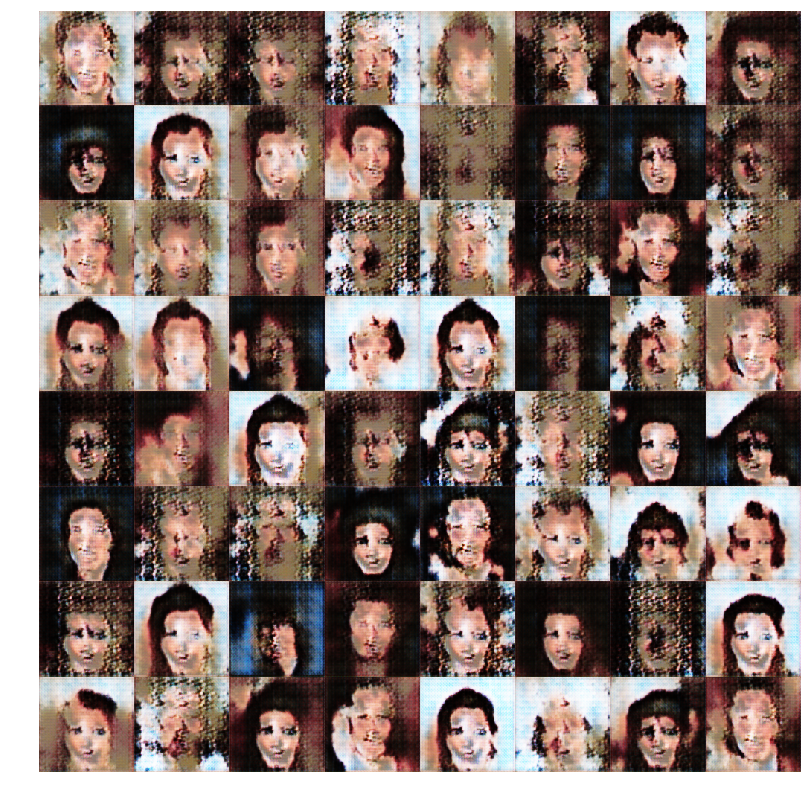

In [11]:
for i in range(1):
    train_wrap(1)

In [ ]:
for i in range(9):
    train_wrap(1)

100%|██████████████████████████████████████████████████████████████████████████████| 3166/3166 [10:50<00:00,  5.52it/s]
D 49.47075   G -22.3643  | D1r 83.62319   D1f 13.08171   D2r 6.415505   D2f 132.4890  | G1 -10.0842   G2 -122.800   mean
_ 2 epoch  run 6332  lr: 0.0002
100%|██████████████████████████████████████████████████████████████████████████████| 3166/3166 [10:38<00:00,  5.81it/s]
D 48.53476   G -21.7082  | D1r 80.91543   D1f 12.81301   D2r 6.409488   D2f 131.2916  | G1 -9.43635   G2 -122.719   mean
_ 3 epoch  run 9498  lr: 0.0002
100%|██████████████████████████████████████████████████████████████████████████████| 3166/3166 [10:43<00:00,  5.25it/s]
D 48.12285   G -21.3974  | D1r 80.15723   D1f 12.69705   D2r 6.390868   D2f 130.0348  | G1 -9.19281   G2 -122.046   mean
_ 4 epoch  run 12664  lr: 0.0002
 13%|██████████                                                                     | 404/3166 [01:23<13:06,  3.51it/s]